In [1]:
#Packages
import pandas as pd
import plotly.express as px

In [77]:
#Import data
data = pd.read_excel(r"C:\Users\jmunoz\SQM\Data\Huasca\Huasca1.xlsx")

In [79]:
#Assign format
data['Date'] = pd.to_datetime(data['Date'])
data['Time'] = pd.to_datetime(data['Time'], format='%H:%M:%S')

In [81]:
#Matrix [hours x days]
matriz = data.pivot_table(index='Time', columns='Date', values='MAS')

In [83]:
#Hours filter
horas_inicio = pd.to_datetime('20:00:00', format='%H:%M:%S').time()
horas_fin = pd.to_datetime('05:00:00', format='%H:%M:%S').time()
f_filtrado = matriz[(matriz.index.time >= horas_inicio) | (matriz.index.time <= horas_fin)]

In [85]:
#Interpolate matrix
matriz_corregida = f_filtrado.interpolate(method='time')
matriz_corregida.index = matriz_corregida.index.strftime('%H:%M:%S')

In [203]:
#Moon correction
#luna_llena = [
#    '2024-01-25', '2024-02-24', '2024-03-25', '2024-04-23', '2024-05-23',
#    '2024-06-21', '2024-07-21', '2024-08-19', '2024-09-18', '2024-10-17',
#    '2024-11-15', '2024-12-15', '2025-01-14', '2025-02-13', '2025-03-14',
#    '2025-04-13', '2025-05-12', '2025-06-11', '2025-07-10', '2025-08-09',
#    '2025-09-07', '2025-10-07', '2025-11-05', '2025-12-05'
#]

#fechas_luna_llena = pd.to_datetime(fechas_luna_llena)
#f_sin_luna_llena = matriz_corregida.loc[:, ~matriz_corregida.columns.isin(fechas_luna_llena)]
#f_sin_luna_llena.index = f_sin_luna_llena .index.strftime('%H:%M:%S')

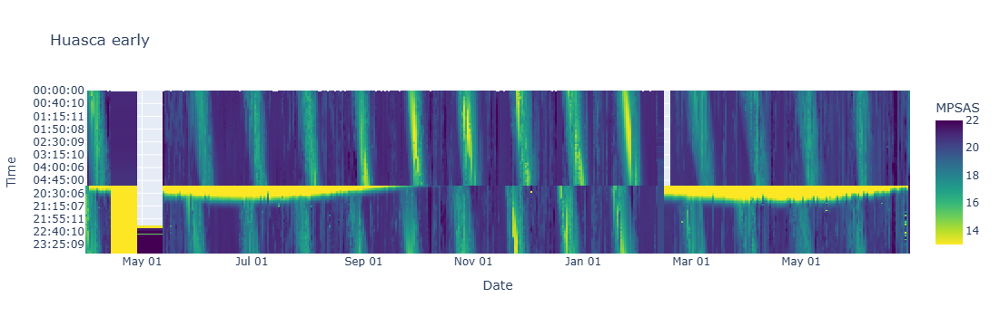

In [93]:
fig = px.imshow(
    matriz_corregida,
    color_continuous_scale='viridis_r', # Usamos la misma rampa de color invertida
    zmin=13,  # Mínimo para la barra de colores
    zmax=22,  # Máximo para la barra de colores
    title='Huasca early',
    labels=dict(x="Date", y="Time", color="MPSAS")
)

# Puedes personalizar el formato de las etiquetas de los ejes
fig.update_xaxes(tickformat="%b %d") # Muestra solo el mes y el día en el eje x
fig.update_yaxes(tickformat="%H:%M") # Muestra solo la hora en el eje y

# Muestra el gráfico interactivo
fig.show()